In [1]:
import os
import glob
import pandas as pd#
from utils import *

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import rcParams

rcParams['figure.dpi'] = 500
rcParams['savefig.dpi'] = 500
rcParams['font.family'] = 'Times'
rcParams['axes.labelsize'] = 14
rcParams['axes.titlesize'] = 14
rcParams['xtick.labelsize'] = 14
rcParams['ytick.labelsize'] = 14
rcParams['legend.fontsize'] = 14
rcParams['figure.titlesize'] = 16

In [3]:
# locate the dataset and result

DATASET_NAME = 'dataset2' 
RESULT_FOLDER = 'result'

### 1. Read data files

In [4]:
### 1. Read data files

data_files = glob.glob(f'{RESULT_FOLDER}/{DATASET_NAME}_*.jsonl')

all_data = {}
for file_path in data_files:
    print("-" * 50)
    model_df = process_jsonl_to_dataframe(file_path)
    model_df['image_id'] = model_df['image_file'].astype(str).str.split('.').str[0]
    if model_df is None or model_df.empty:
        continue
    
    base_filename = os.path.basename(file_path)
    dataset_name = base_filename.split('_')[0]
    true_df_path = f'data/{dataset_name}_info.csv'
    true_df = pd.read_csv(true_df_path)
    
    # Dataset-specific column renaming
    if dataset_name == 'dataset2':
        true_df = true_df.rename(columns={
            'city': 'true_city',
            'state': 'true_state',
            'latitude': 'true_latitude',
            'longitude': 'true_longitude'
        })
        true_cols_to_merge = ['image_id', 'true_city', 'true_state', 'true_latitude', 'true_longitude']
    elif dataset_name == 'dataset1':
        true_df = true_df.rename(columns={
            'city': 'true_city',
            'country': 'true_country',
            'latitude': 'true_latitude',
            'longitude': 'true_longitude'
        })
        true_cols_to_merge = ['image_id', 'true_city', 'true_country', 'true_latitude', 'true_longitude']
    elif dataset_name == 'dataset3':
        true_df = true_df.rename(columns={
            'city': 'true_city',
            'country': 'true_country',
            'latitude': 'true_latitude',
            'longitude': 'true_longitude'
        })
        true_cols_to_merge = ['image_id', 'true_city', 'true_country', 'true_latitude', 'true_longitude']
    
    true_df_subset = true_df[[col for col in true_cols_to_merge if col in true_df.columns]]
    
    merged_df = pd.merge(model_df, true_df_subset, on='image_id', how='left')

    if 'country' in merged_df.columns:
        merged_df['country'] = merged_df['country'].replace('United States', 'USA').replace('United Kingdom', 'England')

    if 'true_country' in merged_df.columns:
        merged_df['true_country'] = merged_df['true_country'].replace('United States', 'USA').replace('United Kingdom', 'England')
    
    merged_df['state'] = merged_df['state'].apply(standardize_state)
    merged_df['confidence'] = merged_df['confidence'].apply(standardize_confidence)
    
    final_df = calculate_distances(merged_df)
    original_model_name = final_df['model_used'].iloc[0]
    simplified_name = simplify_model_name(original_model_name)

    all_data[simplified_name] = final_df

print("-" * 50)
print(f"\nSuccessfully processed data for {len(all_data)} models.")

--------------------------------------------------
Reading data from 'result/dataset2_Llama-4-Maverick-17B-128E-Instruct-FP8.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_Llama-3.2-11B-Vision-Instruct-Turbo.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_gemini-2.5-flash.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_gpt-4.1.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_gemini-1.5-pro-latest.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_gemini-2.5-pro.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_gpt-4.1-mini.jsonl'...
--------------------------------------------------
Reading data from 'result/dataset2_o3.jsonl'...
--------------------------------------------------
Reading data from 'result/da

In [5]:
def check(true_column, pred_column):
    """
    Check if two values match (case-insensitive).
    
    Parameters:
    true_column: The true/expected value
    pred_column: The predicted/actual value
    
    Returns:
    bool: True if values match (case-insensitive), False otherwise
    """
    true_val = str(true_column).lower() if pd.notna(true_column) else ''
    pred_val = str(pred_column).lower() if pd.notna(pred_column) else ''
    
    return true_val == pred_val


all_dfs = []

for model_name, model_df in all_data.items():
    temp_df = model_df.copy()
    temp_df['model'] = model_name
    all_dfs.append(temp_df)

combined_df = pd.concat(all_dfs, ignore_index=True)

if DATASET_NAME == "dataset1" or DATASET_NAME == "dataset3":
    combined_df['country_match'] = combined_df.apply(lambda row: check(row['true_country'], row['country']), axis=1)
else:
    combined_df['state_match'] = combined_df.apply(lambda row: check(row['true_state'], row['state']), axis=1)
combined_df['city_match'] = combined_df.apply(lambda row: check(row['true_city'], row['city']), axis=1)
#combined_df.to_csv(f'{DATASET_NAME}_result.csv', index=False)

In [6]:
accuracy_df = get_performance_df(all_data)
display(accuracy_df)
#accuracy_df.to_excel(f'{DATASET_NAME}_bench.xlsx',index=False)

,model,city_accuracy,state_accuracy,country_accuracy,mean_distance_km,median_distance_km,max_distance_km,min_distance_km,total_tokens,avg_tokens,total_cost_usd,avg_cost_usd
0,llama-4-17b,0.090567,0.248175,NaN,1217.486267,534.276735,16249.737431,0.024290,5172542.0,1766.578552,1.779521,0.000608
1,llama-3.2-11b,0.082258,0.189310,NaN,955.537907,353.217494,14204.177784,0.029224,2407722.0,822.309426,0.433390,0.000148
2,gemini-2.5-flash,0.199106,0.446036,NaN,587.690114,212.235040,16323.202876,0.014763,3882500.0,1325.990437,3.736926,0.001276
3,gpt-4.1,0.206696,0.442414,NaN,685.769205,236.108252,17451.991477,0.001529,4288952.0,1464.806011,13.314676,0.004547
4,gemini-1.5-pro,0.163469,0.365762,NaN,406.465430,109.455252,16786.989987,0.001529,3412197.0,1165.367828,6.937425,0.002369
5,gemini-2.5-pro,0.264274,0.495353,NaN,544.355721,150.389981,15304.503912,0.007244,3887331.0,1327.640369,15.131681,0.005168
6,gpt-4.1-mini,0.125427,0.328841,NaN,768.823745,376.698300,13643.660453,0.001410,4380036.0,1495.913934,2.701480,0.000923
7,o3,0.239494,0.457645,NaN,662.684007,214.273640,17592.307873,0.007945,6679728.0,2281.327869,33.678252,0.011502
8,llama-3.2-90b,0.115615,0.239756,NaN,706.838244,162.954925,9288.105680,0.023268,15243453.0,5206.097336,18.292144,0.006247
9,claude-3.5-haiku,0.087232,0.300048,NaN,697.114125,258.685726,12495.334667,0.091737,4161343.0,1421.223702,5.566729,0.001901


In [7]:
# 1. Define the desired order for models in all plots
# Models not in this list will be appended alphabetically at the end.
model_order = [
    'gpt-4.1-mini',
    'gpt-4.1',
    'o3',
    'gemini-1.5-pro',
    'gemini-2.5-flash',
    'gemini-2.5-pro',
    'llama-4-17b',
    'llama-3.2-11b',
    'llama-3.2-90b',
    'claude-3.5-haiku',
]

# 2. Define custom figure sizes (width, height in inches)
size_wide = (15, 7)
size_standard = (15, 5)

num_models = len(all_data)
layout_rows = 2
layout_cols = 5

print(f"Using a {layout_rows}x{layout_cols} layout for plots.")

Using a 2x5 layout for plots.


--- Distance Error Distribution ---


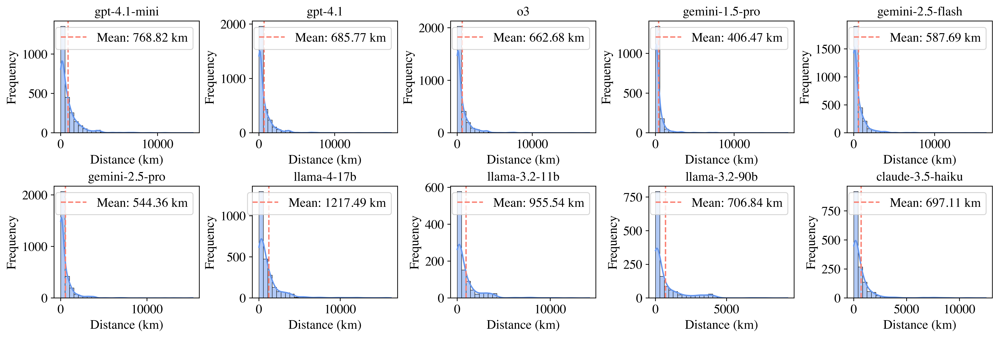

In [8]:
print("--- Distance Error Distribution ---")
create_distribution_visualization(
    all_data, 
    rows=layout_rows, 
    cols=layout_cols,
    figsize=size_standard,
    model_order=model_order
)

--- Distance vs. Confidence Score ---


/Users/lingyaoli/Desktop/Project-LLM-Location/src/utils.py:483: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(int(x)) for x in standard_confidence_levels])
/Users/lingyaoli/Desktop/Project-LLM-Location/src/utils.py:483: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(int(x)) for x in standard_confidence_levels])
/Users/lingyaoli/Desktop/Project-LLM-Location/src/utils.py:483: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels([str(int(x)) for x in standard_confidence_levels])
/Users/lingyaoli/Desktop/Project-LLM-Location/src/utils.py:483: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xtickla

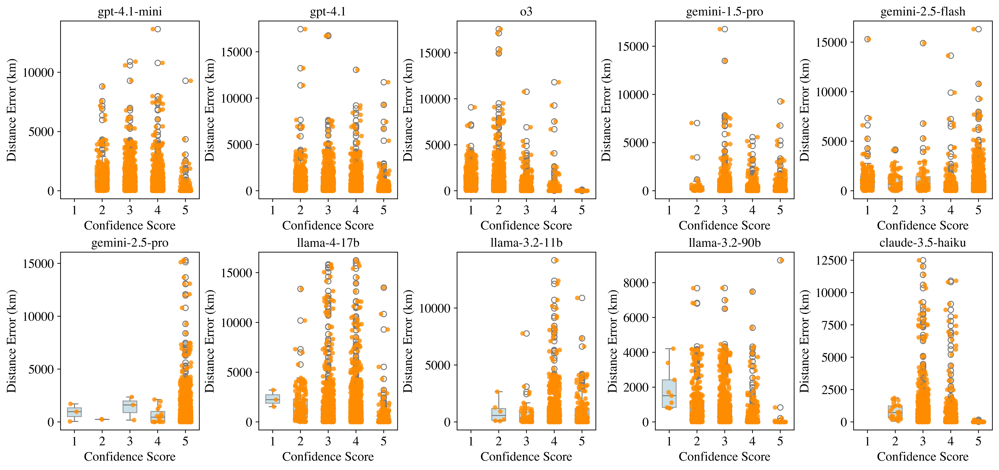

In [9]:
print("--- Distance vs. Confidence Score ---")
create_confidence_visualization(
    all_data, 
    rows=layout_rows, 
    cols=layout_cols,
    figsize=size_wide,
    model_order=model_order
)

--- Predicted vs. True Latitude (with custom range) ---


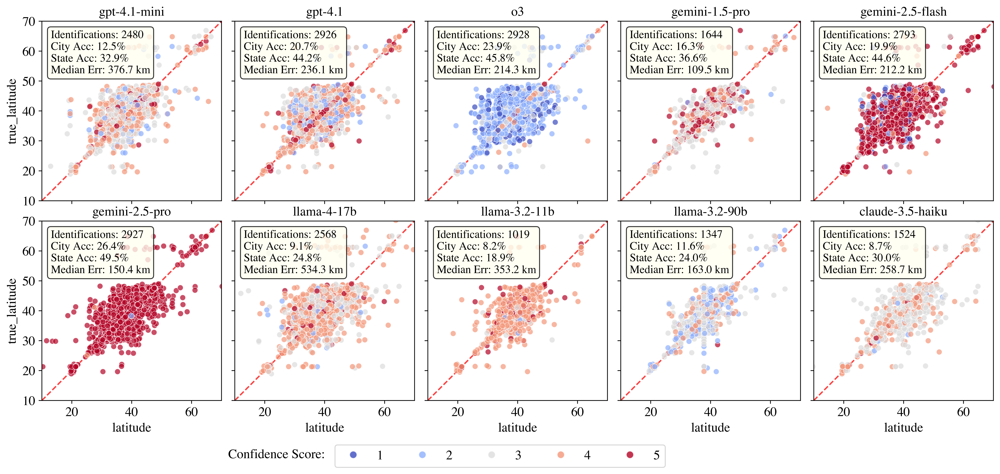

In [ ]:
# custom_lat_range = [-60, 80] # world-dataset1
custom_lat_range = [10, 70]  # us-dataset2

print("--- Predicted vs. True Latitude (with custom range) ---")
create_latitude_visualization(
    all_data, 
    rows=layout_rows,
    cols=layout_cols,
    accuracy_df=accuracy_df, 
    dataset_name=DATASET_NAME,
    axis_range=custom_lat_range,
    figsize=size_wide,
    model_order=model_order,
    save_path=f'{DATASET_NAME}_latitude_bench.pdf'
)

--- Predicted vs. True Longitude ---


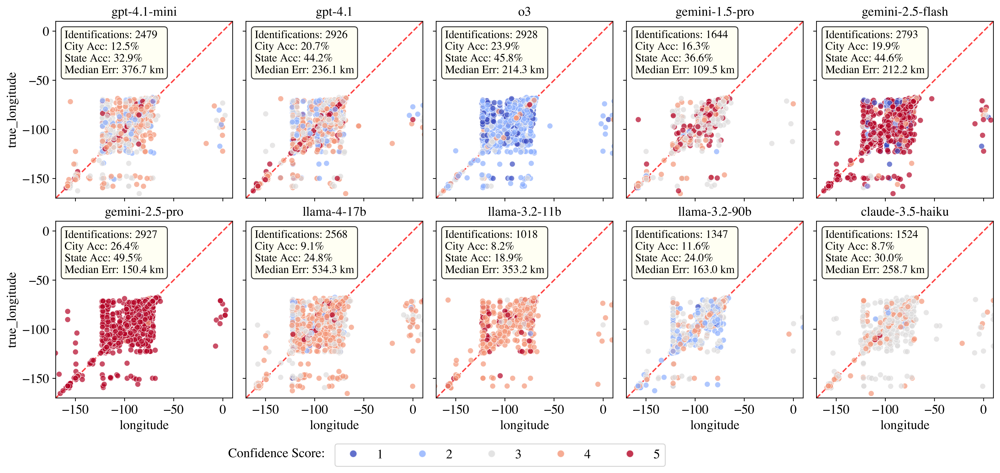

In [ ]:
# custom_lng_range = [-150, 160] # world-dataset1
custom_lng_range = [-170, 10]  # us-dataset2

print("--- Predicted vs. True Longitude ---")
create_longitude_visualization(
    all_data,
    rows=layout_rows,
    cols=layout_cols,
    accuracy_df=accuracy_df,
    dataset_name=DATASET_NAME,
    axis_range=custom_lng_range,
    figsize=size_wide,
    model_order=model_order,
    save_path=f'{DATASET_NAME}_longitude_bench.pdf'
)